# Importing dataset

In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
sb.set()
from sklearn import metrics
import missingno as msn
%matplotlib inline
import matplotlib.pyplot as plt
reg_data = pd.read_excel('WHR2018Chapter2OnlineData.xls',sheet_name = 'SupportingFactors')
data = pd.read_excel('WHR2018Chapter2OnlineData.xls',sheet_name = 'Table2.1')
region = pd.DataFrame(reg_data[["country","Region indicator"]])  # extracting region information from supporting factors sheet

data_M = data.merge(region, on='country', how='left')         # inserting a column of region corresponding to countries to the dataset
col = list(data_M)
col.insert(1,col.pop(col.index('Region indicator')))
data_M = data_M.loc[:,col]
data_M['Region indicator'].fillna("None", inplace=True)
data_M.head(100)    # merged data


,country,Region indicator,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,South Asia,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,South Asia,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,South Asia,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,South Asia,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,South Asia,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540
5,Afghanistan,South Asia,2013,3.572100,7.503376,0.483552,51.042980,0.577955,0.074735,0.823204,0.620585,0.273328,0.482847,-1.879709,-1.403036,1.223690,0.342569,NaN,NaN,0.304368
6,Afghanistan,South Asia,2014,3.130896,7.484583,0.525568,51.370525,0.508514,0.118579,0.871242,0.531691,0.374861,0.409048,-1.773257,-1.312503,1.395396,0.445686,NaN,NaN,0.413974
7,Afghanistan,South Asia,2015,3.982855,7.466215,0.528597,51.693527,0.388928,0.094686,0.880638,0.553553,0.339276,0.260557,-1.844364,-1.291594,2.160618,0.542480,NaN,NaN,0.596918
8,Afghanistan,South Asia,2016,4.220169,7.461401,0.559072,52.016529,0.522566,0.057072,0.793246,0.564953,0.348332,0.324990,-1.917693,-1.432548,1.796219,0.425627,NaN,NaN,0.418629
9,Afghanistan,South Asia,2017,2.661718,7.460144,0.490880,52.339527,0.427011,-0.106340,0.954393,0.496349,0.371326,0.261179,NaN,NaN,1.454051,0.546283,NaN,NaN,0.286599


# Exploratory data analysis

In [2]:
data_M.describe() #Check the Summary Statistics 

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
count,1562.000000,1562.000000,1535.000000,1549.000000,1553.000000,1533.000000,1482.000000,1472.000000,1544.000000,1550.000000,1401.000000,1391.000000,1391.000000,1562.000000,1562.000000,583.000000,1386.000000,1205.000000
mean,2011.820743,5.433676,9.220822,0.810669,62.249887,0.728975,0.000079,0.753622,0.708969,0.263171,0.480207,-0.126617,0.004947,2.003501,0.387271,0.372846,0.386948,0.445204
std,3.419787,1.121017,1.184035,0.119370,7.960671,0.145408,0.164202,0.185538,0.107644,0.084006,0.190724,0.873259,0.981052,0.379684,0.119007,0.086609,0.083694,0.105410
min,2005.000000,2.661718,6.377396,0.290184,37.766476,0.257534,-0.322952,0.035198,0.362498,0.083426,0.068769,-2.448228,-2.144974,0.863034,0.133908,0.241000,0.228833,0.223470
25%,2009.000000,4.606351,8.310665,0.748304,57.299580,0.633754,-0.114313,0.697359,0.621471,0.204116,0.334732,-0.772010,-0.717463,1.737934,0.309722,0.307000,0.321583,0.368531
50%,2012.000000,5.332600,9.398610,0.833047,63.803192,0.748014,-0.022638,0.808115,0.717398,0.251798,0.463137,-0.225939,-0.210142,1.960345,0.369751,0.349000,0.371000,0.425395
75%,2015.000000,6.271025,10.190634,0.904329,68.098228,0.843628,0.094649,0.880089,0.800858,0.311515,0.610723,0.665944,0.717996,2.215920,0.451833,0.433500,0.433104,0.508579
max,2017.000000,8.018934,11.770276,0.987343,76.536362,0.985178,0.677773,0.983276,0.943621,0.704590,0.993604,1.540097,2.184725,3.527820,1.022769,0.648000,0.626000,0.961435


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 <a list of 13 Text xticklabel objects>)

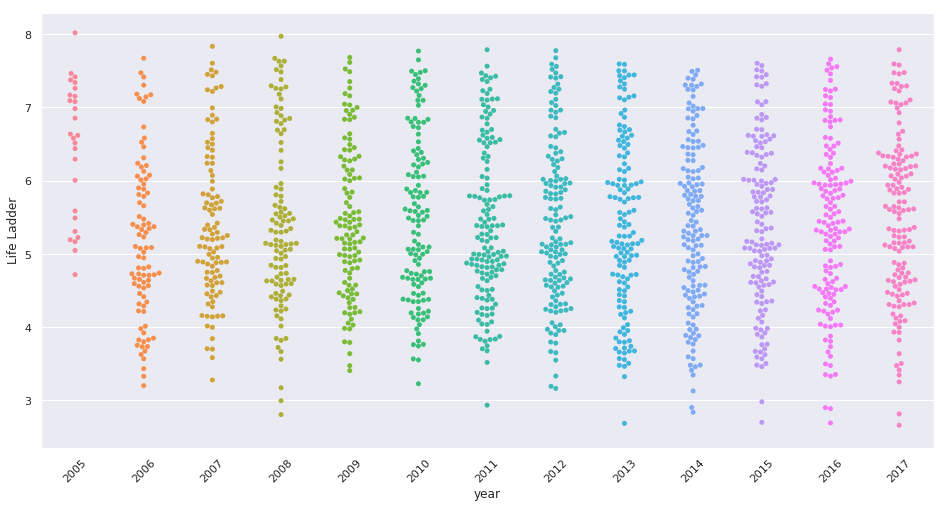

In [3]:
fig, axes = plt.subplots(figsize = (16, 8))  #Distribution of Life Ladder of all countries in the data for given years
sb.swarmplot(x="year", y="Life Ladder",  data=data_M, ax = axes)   #shown through swarmplot
plt.xticks(rotation=45)

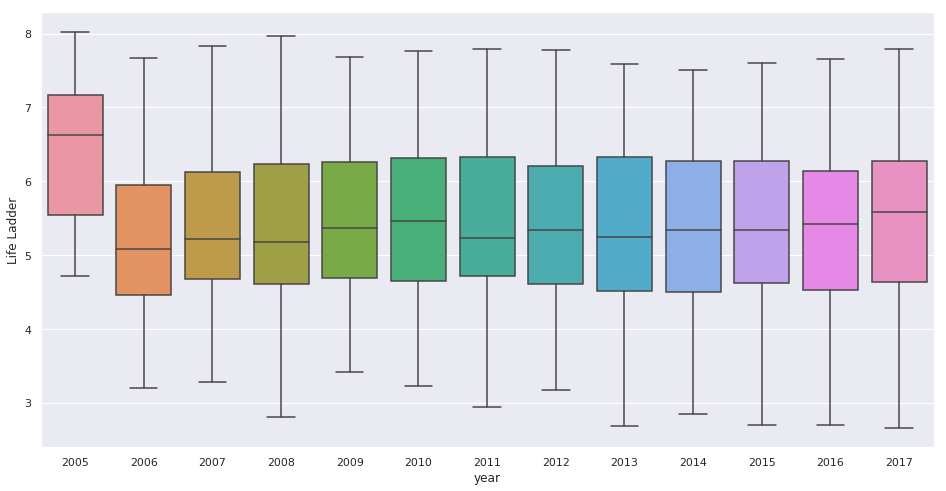

In [4]:
fig, axes = plt.subplots(figsize = (16, 8))  #Distribution of Life Ladder of all countries in the data for given years
sb.boxplot(x="year", y="Life Ladder",  data=data_M, ax = axes)   #shown throught boxplot

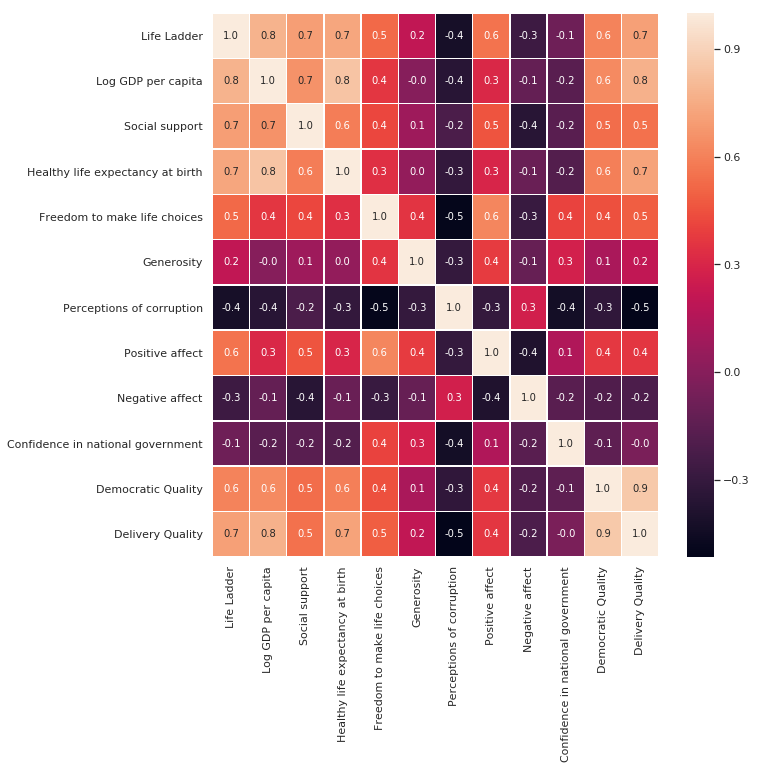

In [5]:
data_c = data_M.drop(['year','Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year','GINI index (World Bank estimate)','GINI index (World Bank estimate), average 2000-15','gini of household income reported in Gallup, by wp5-year'],axis=1)
f,ax = plt.subplots(figsize=(10, 10))     #heatmap showing relationship of some factors compared to one another
sb.heatmap(data_c.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

/home/cuong/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/cuong/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


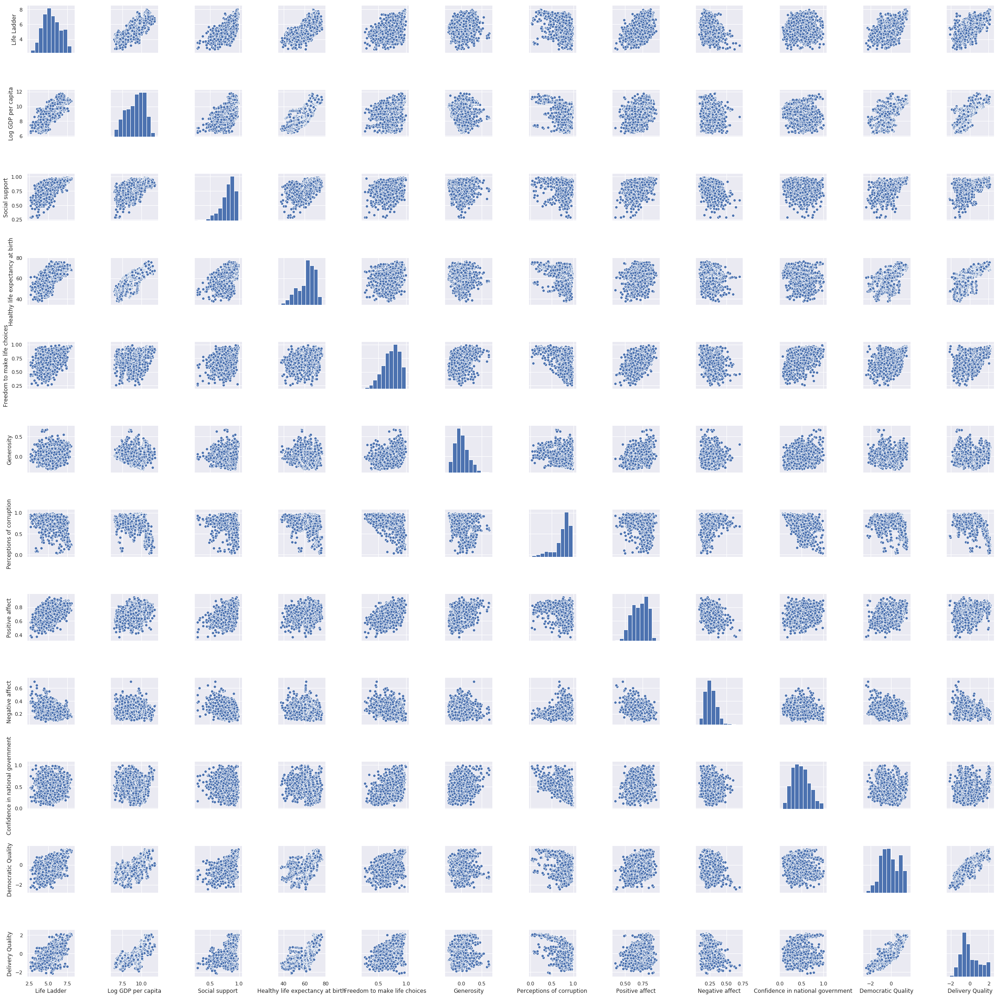

In [7]:
sb.pairplot(data = data_c)    #pair of those variables against one another

Text(0.5, 1.0, 'Average happiness score for regions between 2005-2017')

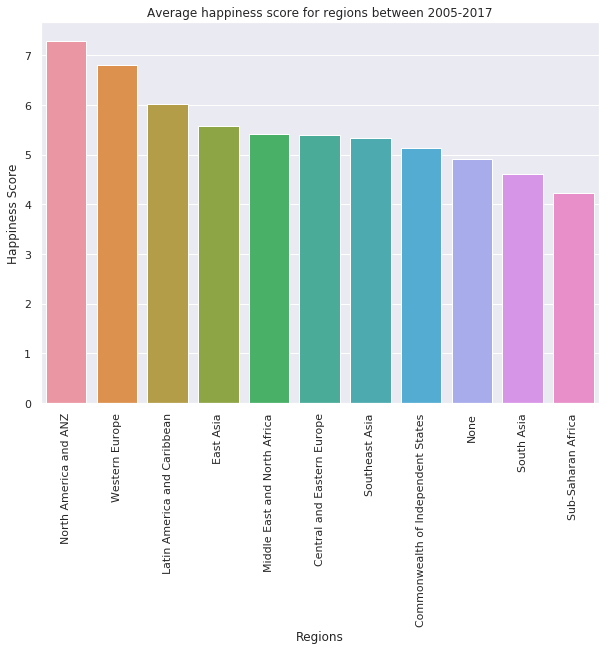

In [8]:
#average life ladder score for each region for all the given years combined
region_list = list(data_M['Region indicator'].unique())    
region_happiness_score_average= []
for i in region_list:
    x = data_M[data_M['Region indicator'] == i]
    region_happiness_score_rate = sum(x["Life Ladder"])/len(x)
    region_happiness_score_average.append(region_happiness_score_rate)

data_bar = pd.DataFrame({'region_list':region_list, 'region_happiness_score_average':region_happiness_score_average})
new_index = (data_bar['region_happiness_score_average'].sort_values(ascending = False)).index.values
sorted_data = data_bar.reindex(new_index)

#visualisation
plt.figure(figsize=(10,7))
sb.barplot(x=sorted_data['region_list'], y=sorted_data['region_happiness_score_average'])
plt.xticks(rotation= 90)
plt.xlabel('Regions')
plt.ylabel('Happiness Score')
plt.title('Average happiness score for regions between 2005-2017')

In [9]:
happycountries = data_M['Life Ladder']>=6.5   #filtering out countries with relatively high life ladder
happycountries = data_M[happycountries]
happycountries["Region indicator"].unique()

array(['Latin America and Caribbean', 'North America and ANZ',
       'Western Europe', 'Middle East and North Africa',
       'Central and Eastern Europe', 'East Asia', 'None',
       'Southeast Asia', 'Commonwealth of Independent States'],
      dtype=object)

Text(0.5, 1.0, 'Happier Regions')

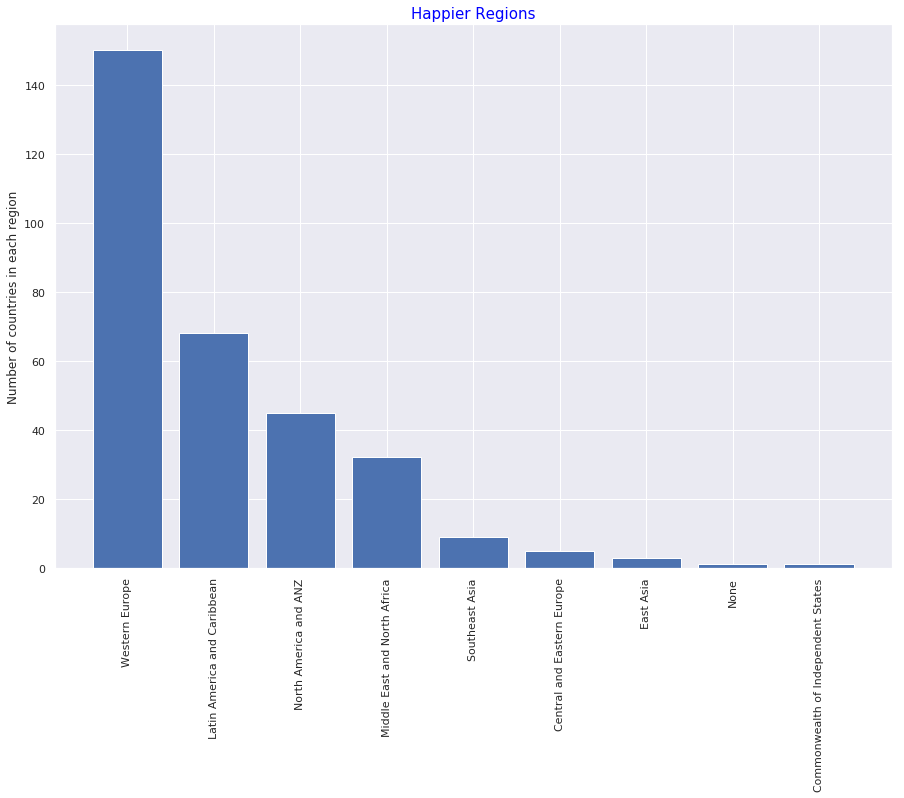

In [10]:
labels = happycountries["Region indicator"].value_counts().index
colors = ['purple','blue','red','yellow','green','orange','lightcoral','pink','black']
explode = [0,0,0,0,0,0,0,0,0]
sizes = happycountries["Region indicator"].value_counts().values

# visual
plt.figure(figsize = (15,10))
plt.bar(labels,sizes)
plt.xticks(rotation=90)
plt.ylabel('Number of countries in each region')
plt.title('Happier Regions', color = 'blue', fontsize=15)


In [11]:
middlecountries = data_M[5<=data_M['Life Ladder']]   #filtering out countries with mid life ladder score
middlecountries = middlecountries[data_M['Life Ladder']<6.5]
middlecountries["Region indicator"].unique()

/home/cuong/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


array(['Central and Eastern Europe', 'Middle East and North Africa',
       'Sub-Saharan Africa', 'Latin America and Caribbean',
       'Commonwealth of Independent States', 'South Asia', 'East Asia',
       'None', 'Western Europe', 'Southeast Asia'], dtype=object)

Text(0.5, 1.0, 'Mid-Happy Regions')

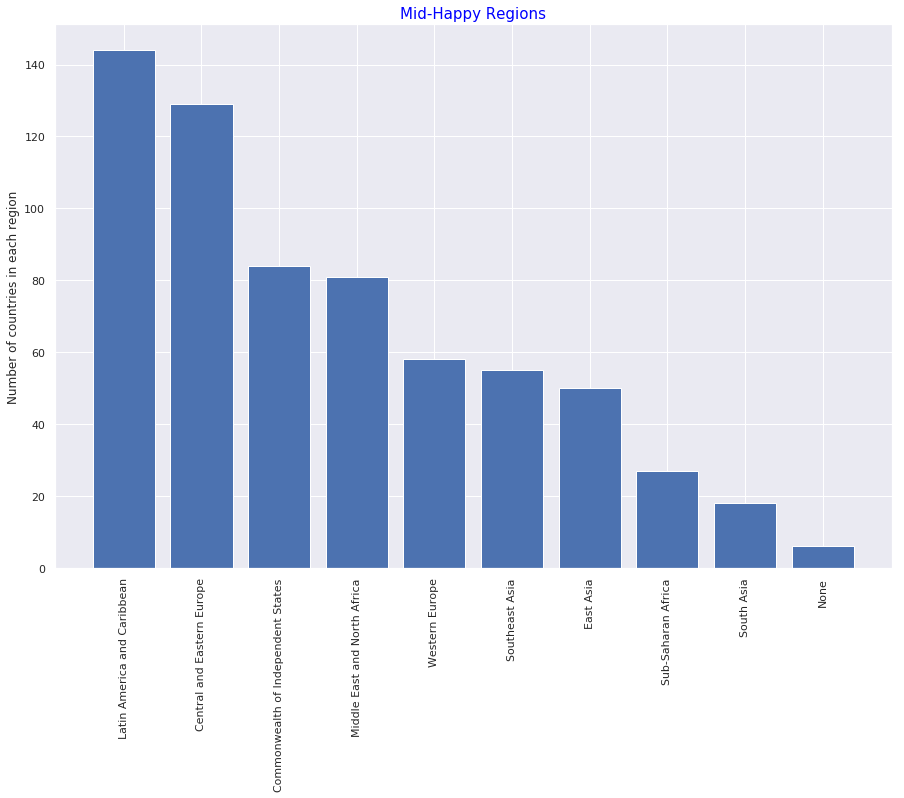

In [12]:
labels = middlecountries["Region indicator"].value_counts().index
colors = ['purple','blue','red','yellow','green','orange','lightcoral','pink','brown','grey']
explode = [0,0,0,0,0,0,0,0,0,0]
sizes = middlecountries["Region indicator"].value_counts().values

# visual
plt.figure(figsize = (15,10))
plt.bar(labels, sizes)
plt.xticks(rotation=90)
plt.ylabel('Number of countries in each region')
plt.title('Mid-Happy Regions',color = 'blue',fontsize = 15)

In [13]:
sadcountries = data_M['Life Ladder']<5   #filtering out countries with relatively low life ladder
sadcountries = data_M[sadcountries]
sadcountries["Region indicator"].unique()

array(['South Asia', 'Central and Eastern Europe', 'Sub-Saharan Africa',
       'Commonwealth of Independent States',
       'Middle East and North Africa', 'Southeast Asia', 'East Asia',
       'None', 'Latin America and Caribbean', 'Western Europe'],
      dtype=object)

Text(0.5, 1.0, 'Less Happier Regions')

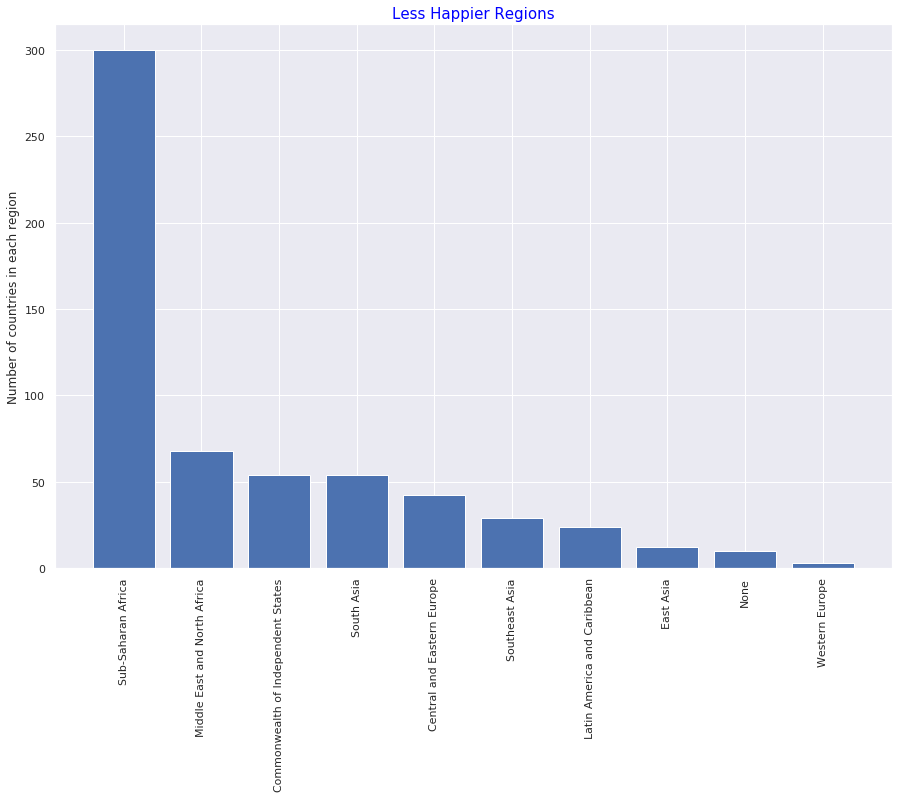

In [14]:
labels = sadcountries["Region indicator"].value_counts().index
colors = ['purple','blue','red','yellow','green','orange','lightcoral','pink','brown','grey']
explode = [0,0,0,0,0,0,0,0,0,0]
sizes = sadcountries["Region indicator"].value_counts().values

# visual
plt.figure(figsize = (15,10))
plt.bar(labels,sizes)
plt.xticks(rotation=90)
plt.ylabel('Number of countries in each region')
plt.title('Less Happier Regions',color = 'blue',fontsize = 15)

# Visualisation of missing data

In [15]:
data_M.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1562 entries, 0 to 1561
Data columns (total 20 columns):
country                                                     1562 non-null object
Region indicator                                            1562 non-null object
year                                                        1562 non-null int64
Life Ladder                                                 1562 non-null float64
Log GDP per capita                                          1535 non-null float64
Social support                                              1549 non-null float64
Healthy life expectancy at birth                            1553 non-null float64
Freedom to make life choices                                1533 non-null float64
Generosity                                                  1482 non-null float64
Perceptions of corruption                                   1472 non-null float64
Positive affect                                             1544 non-null flo

<font color='red'>**_visualise the locations where the values are missing_**</font>

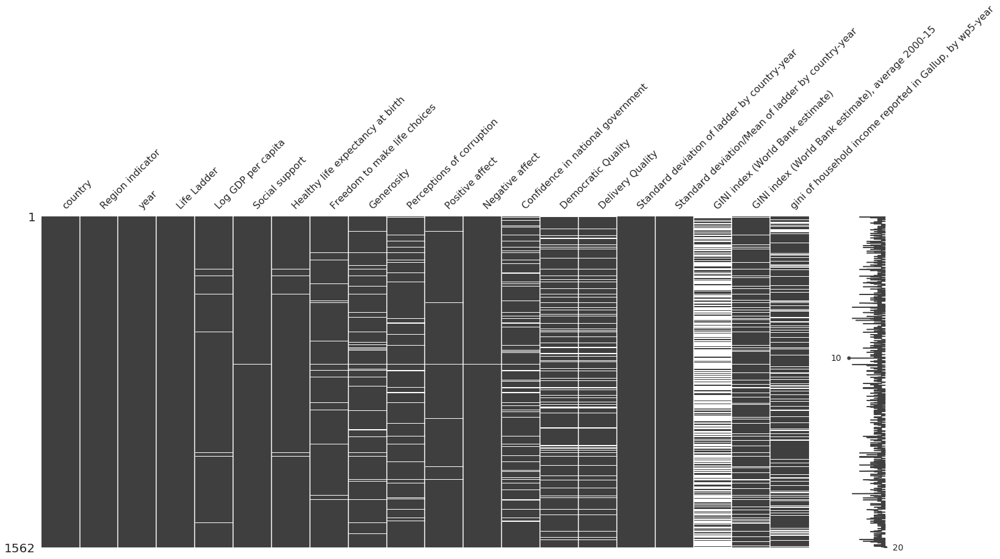

In [16]:
msn.matrix(data_M.sample(1562))   # visualise the locations where the values are missing

<font color='red'>**_count the data points present for each variable in the dataset_**</font>

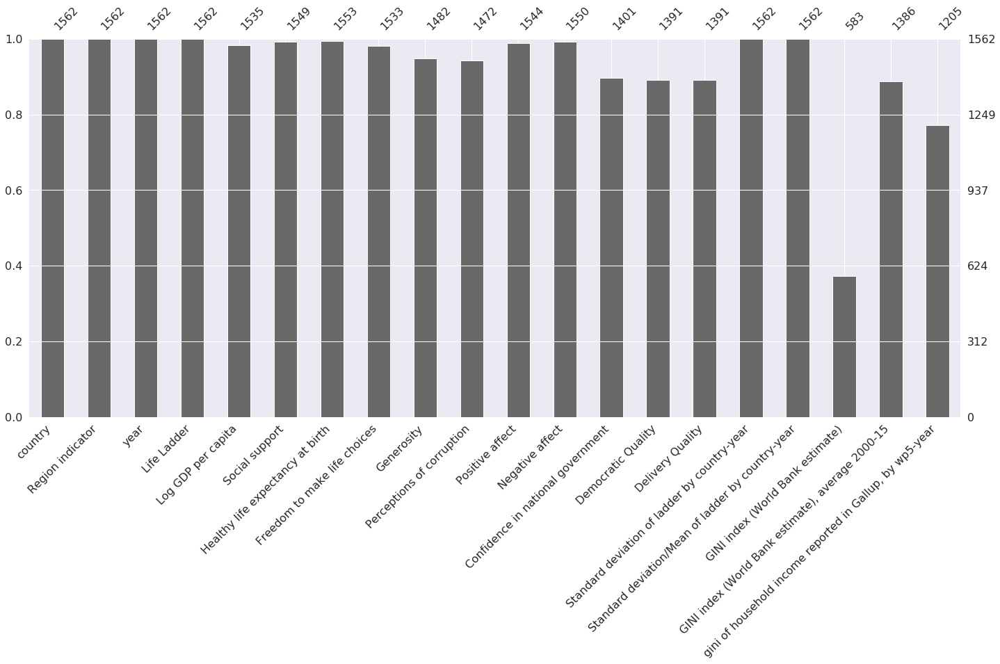

In [17]:
msn.bar(data_M.sample(1562))    # counting the data points present for each variable in the dataset

# Filling in the missing data

<font color='red'>**_We are filling in the missing data for creating regression models, otherwise we would not have enough data points to be used as training data_**</font>

In [18]:
import scipy as sp

<font color='red'>**_scipy.interpolation was used to fill in the missing data values_**</font>

In [19]:
data_pred = data_M.interpolate(method = 'linear')    # use scipy.interpolation to fill in the missing data values
data_pred.head(1562)

,country,Region indicator,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,South Asia,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,South Asia,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,South Asia,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,South Asia,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,South Asia,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540
5,Afghanistan,South Asia,2013,3.572100,7.503376,0.483552,51.042980,0.577955,0.074735,0.823204,0.620585,0.273328,0.482847,-1.879709,-1.403036,1.223690,0.342569,NaN,NaN,0.304368
6,Afghanistan,South Asia,2014,3.130896,7.484583,0.525568,51.370525,0.508514,0.118579,0.871242,0.531691,0.374861,0.409048,-1.773257,-1.312503,1.395396,0.445686,NaN,NaN,0.413974
7,Afghanistan,South Asia,2015,3.982855,7.466215,0.528597,51.693527,0.388928,0.094686,0.880638,0.553553,0.339276,0.260557,-1.844364,-1.291594,2.160618,0.542480,NaN,NaN,0.596918
8,Afghanistan,South Asia,2016,4.220169,7.461401,0.559072,52.016529,0.522566,0.057072,0.793246,0.564953,0.348332,0.324990,-1.917693,-1.432548,1.796219,0.425627,NaN,NaN,0.418629
9,Afghanistan,South Asia,2017,2.661718,7.460144,0.490880,52.339527,0.427011,-0.106340,0.954393,0.496349,0.371326,0.261179,-0.981401,-0.926286,1.454051,0.546283,NaN,NaN,0.286599


In [20]:
data_pred.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1562 entries, 0 to 1561
Data columns (total 20 columns):
country                                                     1562 non-null object
Region indicator                                            1562 non-null object
year                                                        1562 non-null int64
Life Ladder                                                 1562 non-null float64
Log GDP per capita                                          1562 non-null float64
Social support                                              1562 non-null float64
Healthy life expectancy at birth                            1562 non-null float64
Freedom to make life choices                                1562 non-null float64
Generosity                                                  1562 non-null float64
Perceptions of corruption                                   1562 non-null float64
Positive affect                                             1562 non-null flo

<font color='red'>**_some data points are still missing beacause extrapolation was not done and those points lie outside the range of given data_**</font>

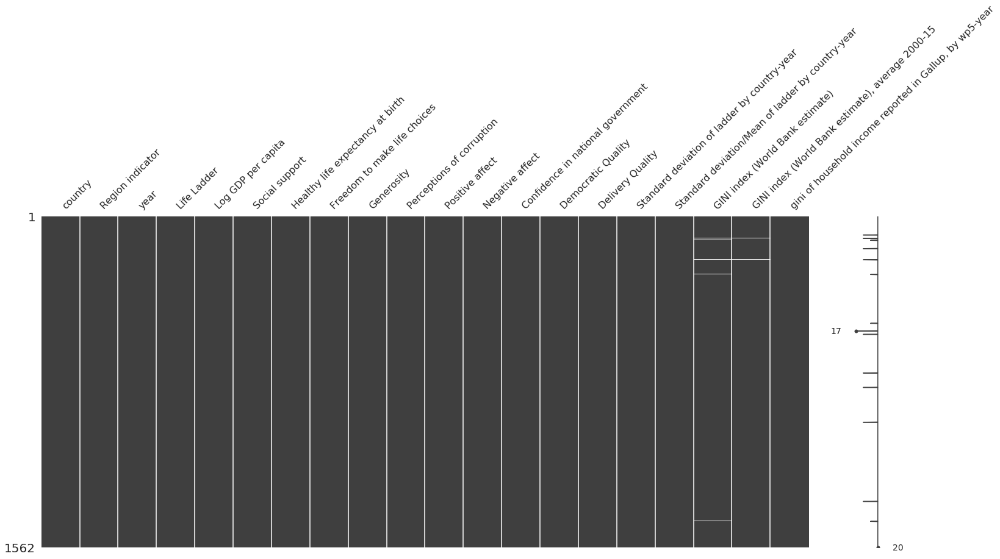

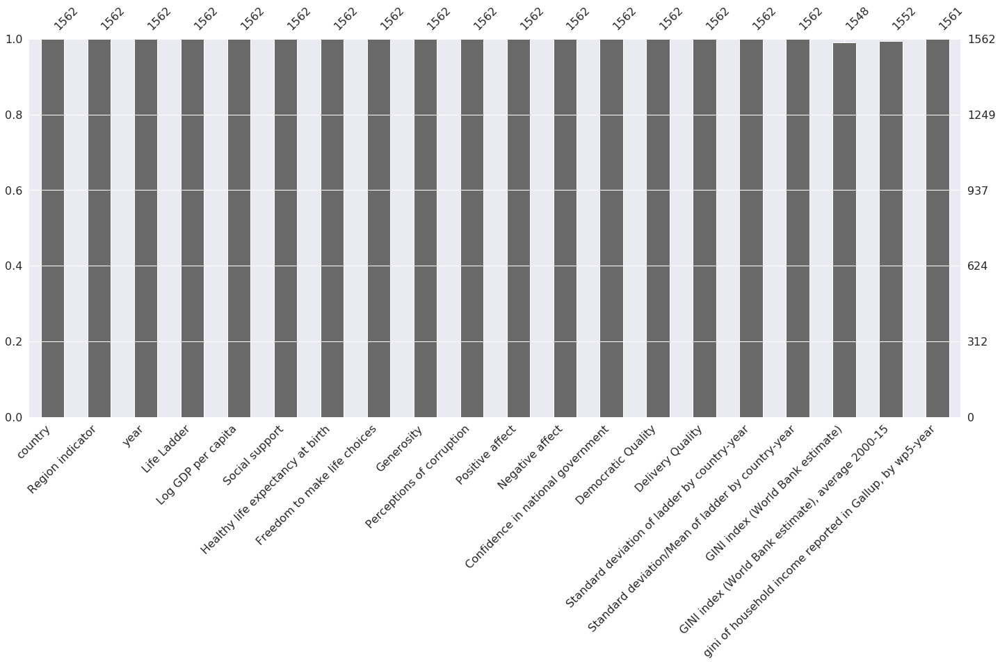

In [21]:
msn.matrix(data_pred.sample(1562))    # some data points are still missing beacause extrapolation was not done and those points lie outside the range of given data

msn.bar(data_pred.sample(1562))

<font color='red'>**_some data points are still missing beacause extrapolation was not done and those points lie outside the range of given data_**</font>

# Visualisation of filled-in data

<font color='red'>**_distribution of original data_**</font>

/home/cuong/anaconda3/lib/python3.7/site-packages/matplotlib/tight_layout.py:199: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/home/cuong/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/cuong/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


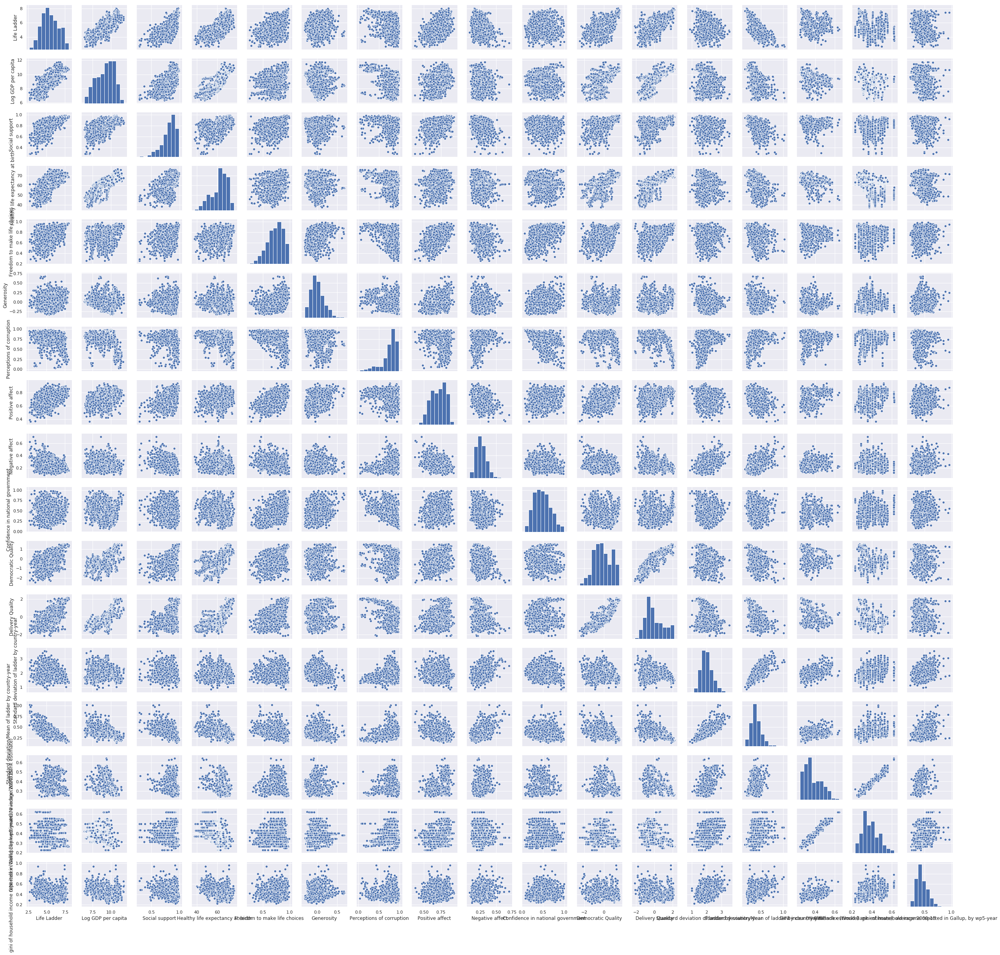

In [22]:
sb.pairplot(data = data_M.drop(['year'],axis=1))    #distribution of original data

<font color='red'>**_distribution of filled in data, which should resemble that of the original data_**</font>

/home/cuong/anaconda3/lib/python3.7/site-packages/matplotlib/tight_layout.py:199: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


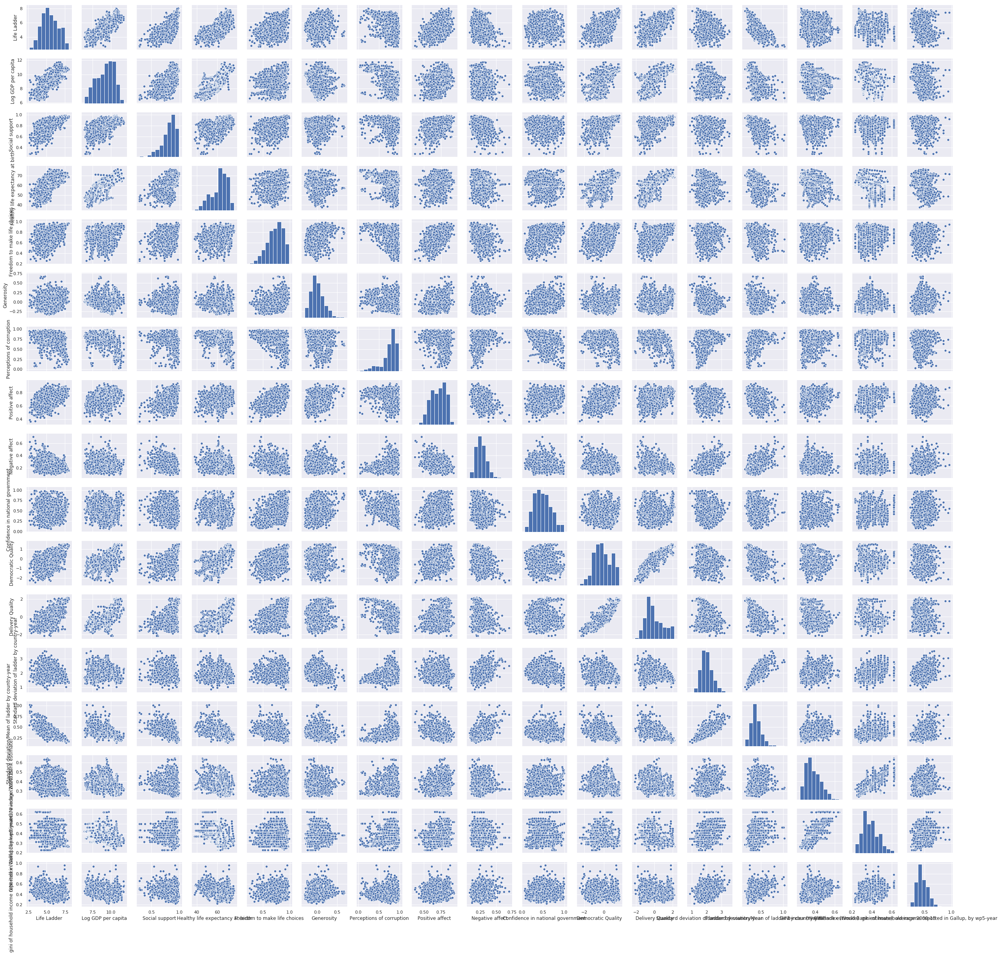

In [23]:
sb.pairplot(data = data_pred.drop(['year'],axis=1))    #distribution of filled in data, which should resemble that of the original data

In [24]:
data_M.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
count,1562.000000,1562.000000,1535.000000,1549.000000,1553.000000,1533.000000,1482.000000,1472.000000,1544.000000,1550.000000,1401.000000,1391.000000,1391.000000,1562.000000,1562.000000,583.000000,1386.000000,1205.000000
mean,2011.820743,5.433676,9.220822,0.810669,62.249887,0.728975,0.000079,0.753622,0.708969,0.263171,0.480207,-0.126617,0.004947,2.003501,0.387271,0.372846,0.386948,0.445204
std,3.419787,1.121017,1.184035,0.119370,7.960671,0.145408,0.164202,0.185538,0.107644,0.084006,0.190724,0.873259,0.981052,0.379684,0.119007,0.086609,0.083694,0.105410
min,2005.000000,2.661718,6.377396,0.290184,37.766476,0.257534,-0.322952,0.035198,0.362498,0.083426,0.068769,-2.448228,-2.144974,0.863034,0.133908,0.241000,0.228833,0.223470
25%,2009.000000,4.606351,8.310665,0.748304,57.299580,0.633754,-0.114313,0.697359,0.621471,0.204116,0.334732,-0.772010,-0.717463,1.737934,0.309722,0.307000,0.321583,0.368531
50%,2012.000000,5.332600,9.398610,0.833047,63.803192,0.748014,-0.022638,0.808115,0.717398,0.251798,0.463137,-0.225939,-0.210142,1.960345,0.369751,0.349000,0.371000,0.425395
75%,2015.000000,6.271025,10.190634,0.904329,68.098228,0.843628,0.094649,0.880089,0.800858,0.311515,0.610723,0.665944,0.717996,2.215920,0.451833,0.433500,0.433104,0.508579
max,2017.000000,8.018934,11.770276,0.987343,76.536362,0.985178,0.677773,0.983276,0.943621,0.704590,0.993604,1.540097,2.184725,3.527820,1.022769,0.648000,0.626000,0.961435


In [25]:
data_pred.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
count,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1548.000000,1552.000000,1561.000000
mean,2011.820743,5.433676,9.223365,0.810988,62.195382,0.729444,-0.000156,0.750424,0.708629,0.263466,0.488070,-0.133233,-0.000937,2.003501,0.387271,0.377524,0.386080,0.450148
std,3.419787,1.121017,1.179246,0.119068,7.987214,0.145367,0.161765,0.183756,0.107445,0.083859,0.193405,0.850163,0.956244,0.379684,0.119007,0.075180,0.081813,0.101448
min,2005.000000,2.661718,6.377396,0.290184,37.766476,0.257534,-0.322952,0.035198,0.362498,0.083426,0.068769,-2.448228,-2.144974,0.863034,0.133908,0.241000,0.228833,0.223470
25%,2009.000000,4.606351,8.317110,0.748905,57.155528,0.633769,-0.112022,0.693003,0.621373,0.204680,0.339864,-0.757349,-0.698575,1.737934,0.309722,0.320000,0.323333,0.378482
50%,2012.000000,5.332600,9.409296,0.833590,63.777138,0.748506,-0.023232,0.803872,0.717398,0.252206,0.468560,-0.218988,-0.209797,1.960345,0.369751,0.361275,0.371000,0.430294
75%,2015.000000,6.271025,10.176374,0.904170,68.064693,0.844807,0.091421,0.874675,0.799524,0.311515,0.620887,0.574689,0.673154,2.215920,0.451833,0.427012,0.432667,0.517130
max,2017.000000,8.018934,11.770276,0.987343,76.536362,0.985178,0.677773,0.983276,0.943621,0.704590,0.993604,1.540097,2.184725,3.527820,1.022769,0.648000,0.626000,0.961435


<font color='red'>**_statistical values of filled in data are plotted against those of the original data and the plots show that their statistical values have negligible variations_**</font>

Text(0, 0.5, 'Median of filled values')

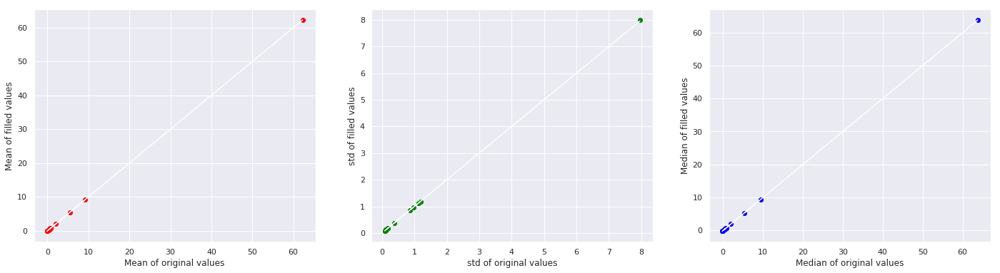

In [26]:
f, axes = plt.subplots(1, 3, figsize=(24, 6))
mean_ori=[]
mean_pred=[]
std_ori=[]
std_pred=[]
median_ori=[]
median_pred=[]
for var in data_M.drop(['country','year','Region indicator'], axis=1):
    mean_ori.append(data_M[var].dropna().mean())
    std_ori.append(data_M[var].dropna().std())
    median_ori.append(data_M[var].dropna().median())

for var in data_pred.drop(['country','year','Region indicator'],axis=1):
    mean_pred.append(data_pred[var].dropna().mean())
    std_pred.append(data_pred[var].dropna().std())
    median_pred.append(data_pred[var].dropna().median())

mean_o=pd.DataFrame(mean_ori)
std_o=pd.DataFrame(std_ori)
median_o=pd.DataFrame(median_ori)
mean_p=pd.DataFrame(mean_pred)
std_p=pd.DataFrame(std_pred)
median_p=pd.DataFrame(median_pred)

axes[0].scatter(mean_o, mean_p, color = "red")
axes[0].plot(mean_o, mean_o, 'w-', linewidth = 1)
axes[0].set_xlabel("Mean of original values")
axes[0].set_ylabel("Mean of filled values")

axes[1].scatter(std_o, std_p, color = "green")
axes[1].plot(std_o, std_o, 'w-', linewidth = 1)
axes[1].set_xlabel("std of original values")
axes[1].set_ylabel("std of filled values")

axes[2].scatter(median_o, median_p, color = "blue")
axes[2].plot(median_o, median_o, 'w-', linewidth = 1)
axes[2].set_xlabel("Median of original values")
axes[2].set_ylabel("Median of filled values")

In [27]:
data_complete = data_pred.dropna()    # we did not use extrapolation to find the missing data points outside the range of given data points because 1.their numbers are not great and 2.their values would be more unreliable as they will be predicted from predicted values.
data_complete.head(1562)

,country,Region indicator,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
14,Albania,Central and Eastern Europe,2012,5.510124,9.246649,0.784502,68.028885,0.601512,-0.174559,0.847675,0.606636,0.271393,0.364894,-0.060784,-0.328862,1.921203,0.348668,0.290000,0.303250,0.568153
15,Albania,Central and Eastern Europe,2013,4.550648,9.258439,0.759477,68.291374,0.631830,-0.132977,0.862905,0.633609,0.338379,0.338095,0.070411,-0.330956,2.315580,0.508846,0.288000,0.303250,0.633796
16,Albania,Central and Eastern Europe,2014,4.813763,9.278097,0.625587,68.512100,0.734648,-0.030553,0.882704,0.684911,0.334543,0.498786,0.314873,-0.187407,2.660069,0.552597,0.286000,0.303250,0.417219
17,Albania,Central and Eastern Europe,2015,4.606651,9.303031,0.639356,68.691956,0.703851,-0.086883,0.884793,0.688370,0.350427,0.506978,0.251629,-0.152544,2.729001,0.592405,0.284000,0.303250,0.422627
18,Albania,Central and Eastern Europe,2016,4.511101,9.337774,0.638411,68.871811,0.729819,-0.023276,0.901071,0.675244,0.321706,0.400910,0.208456,-0.139161,2.646668,0.586701,0.282000,0.303250,0.416540
19,Albania,Central and Eastern Europe,2017,4.639548,9.373718,0.637698,69.051659,0.749611,-0.035140,0.876135,0.669241,0.333884,0.457738,-0.466199,-0.439627,2.682105,0.578096,0.280000,0.303250,0.410488
20,Algeria,Middle East and North Africa,2010,5.463567,9.462701,0.723966,64.298981,0.592696,-0.232023,0.618038,0.609722,0.294390,0.425545,-1.140853,-0.740093,1.626279,0.297659,0.278000,0.276000,0.492713
21,Algeria,Middle East and North Africa,2011,5.317194,9.471962,0.810234,64.529564,0.529561,-0.207379,0.637982,0.550203,0.254897,0.393352,-1.182341,-0.776610,1.660421,0.312274,0.276000,0.276000,0.426202
22,Algeria,Middle East and North Africa,2012,5.604596,9.485086,0.839397,64.739365,0.586663,-0.198871,0.690116,0.604023,0.229716,0.361159,-1.115535,-0.771172,1.939237,0.346008,0.299000,0.276000,0.421409
23,Algeria,Middle East and North Africa,2014,6.354898,9.509210,0.818189,65.130157,0.536666,-0.197471,0.693336,0.625905,0.176866,0.328966,-1.002867,-0.783428,1.632461,0.256882,0.322000,0.276000,0.475492


<font color='red'>**_we did not use extrapolation to find the missing data points outside the range of given data points because of two reasons:
    <br>
    1.their numbers are not great and 
    <br>
    2.their values would be more unreliable as they will be predicted from predicted values_**</font>

In [28]:
data_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1548 entries, 14 to 1561
Data columns (total 20 columns):
country                                                     1548 non-null object
Region indicator                                            1548 non-null object
year                                                        1548 non-null int64
Life Ladder                                                 1548 non-null float64
Log GDP per capita                                          1548 non-null float64
Social support                                              1548 non-null float64
Healthy life expectancy at birth                            1548 non-null float64
Freedom to make life choices                                1548 non-null float64
Generosity                                                  1548 non-null float64
Perceptions of corruption                                   1548 non-null float64
Positive affect                                             1548 non-null fl

<font color='red'>**_check the first column or first row to see which variable has the highest correlation coefficient with Life Ladder_**</font>

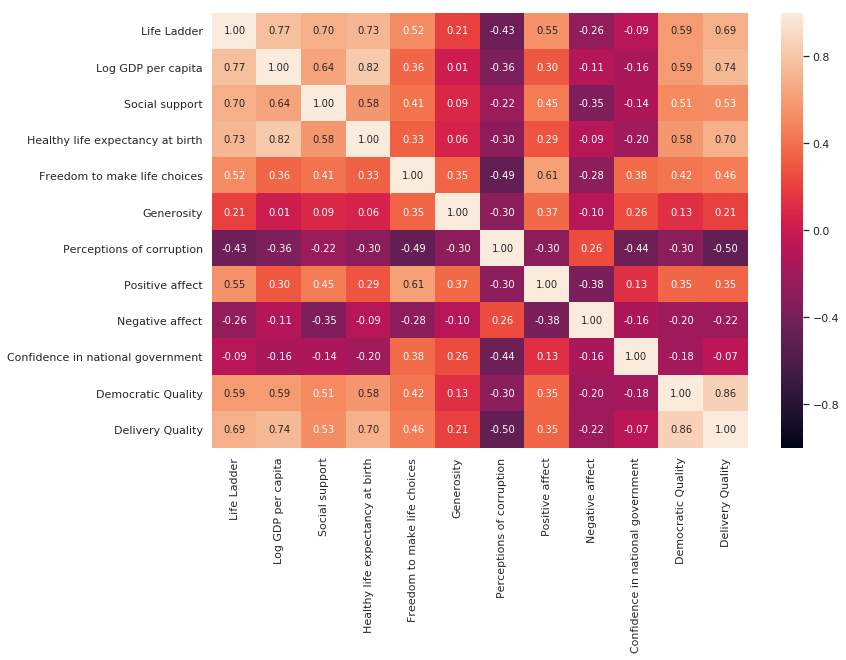

In [29]:
data_c = data_complete.drop(['year','Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year','GINI index (World Bank estimate)','GINI index (World Bank estimate), average 2000-15','gini of household income reported in Gallup, by wp5-year'],axis=1)
f, axes = plt.subplots(1, 1, figsize=(12, 8))
sb.heatmap(data_c.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")    # check the first column or first row to see which variable has the highest correlation coefficient with Life Ladder

# Building regression models

## <font color='purple'>Preparation of train-test datasets</font>

In [30]:
data_comp = data_complete.drop(['GINI index (World Bank estimate)'],axis = 1)

<font color='red'>**_we are not going to use this column in building our model because the number data points given in the dataset was less than half of the number of the whole dataset and our model would be entirely based on our predicted values when we filled in the missing data points_**</font>

In [31]:
data_comp = data_comp.drop(['Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year'],axis = 1)

<font color='red'>**_we are not going to use these columns because they are directly related/calculated from life ladder, which is the variable that we are trying to predict_**</font>

In [32]:
data_comp1 = data_comp.drop(['year','country','Region indicator'],axis = 1).reset_index()

data_comp = data_comp1.drop(['index'],axis = 1)

<font color='red'>**_we are not going to use these columns because they are string variables/do not have a linear relationship with life ladder_**</font>

In [33]:
data_comp.head()

,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,5.510124,9.246649,0.784502,68.028885,0.601512,-0.174559,0.847675,0.606636,0.271393,0.364894,-0.060784,-0.328862,0.30325,0.568153
1,4.550648,9.258439,0.759477,68.291374,0.631830,-0.132977,0.862905,0.633609,0.338379,0.338095,0.070411,-0.330956,0.30325,0.633796
2,4.813763,9.278097,0.625587,68.512100,0.734648,-0.030553,0.882704,0.684911,0.334543,0.498786,0.314873,-0.187407,0.30325,0.417219
3,4.606651,9.303031,0.639356,68.691956,0.703851,-0.086883,0.884793,0.688370,0.350427,0.506978,0.251629,-0.152544,0.30325,0.422627
4,4.511101,9.337774,0.638411,68.871811,0.729819,-0.023276,0.901071,0.675244,0.321706,0.400910,0.208456,-0.139161,0.30325,0.416540


In [34]:
y = pd.DataFrame(data_comp['Life Ladder'])
X = data_comp.drop(['Life Ladder'],axis = 1)    # drop life ladder becasue it is the variable we are trying to predict

<font color='red'>**_drop life ladder because it is the variable we are trying to predict_**</font>

## <font color='purple'>Linear regression model</font>

In [35]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("X_Train Set :", X_train.shape)
print("y_Train Set :", y_train.shape)
print("X_Test Set  :", X_test.shape)
print("y_Test Set  :", y_test.shape)

X_Train Set : (1238, 13)
y_Train Set : (1238, 1)
X_Test Set  : (310, 13)
y_Test Set  : (310, 1)


In [36]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()

In [37]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error

In [38]:
linreg.fit(X_train, y_train)    # train the model with train data
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()
pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"])

Intercept of Regression 	: b =  [-0.66262205]
Coefficients of Regression 	: a =  [[ 2.58166366e-01  1.88029874e+00  2.21673618e-02  6.25045038e-01
   4.65631852e-01 -8.14079083e-01  2.36413472e+00  6.09272078e-02
  -5.87838801e-01  1.58177345e-03  6.65096240e-02 -4.73270328e-02
  -9.22356124e-01]]



,Predictors,Coefficients
0,Log GDP per capita,0.258166
1,Social support,1.880299
2,Healthy life expectancy at birth,0.022167
3,Freedom to make life choices,0.625045
4,Generosity,0.465632
5,Perceptions of corruption,-0.814079
6,Positive affect,2.364135
7,Negative affect,0.060927
8,Confidence in national government,-0.587839
9,Democratic Quality,0.001582


### <font color='grey'> Using cross validation to get an estimate of how well the model will do</font>

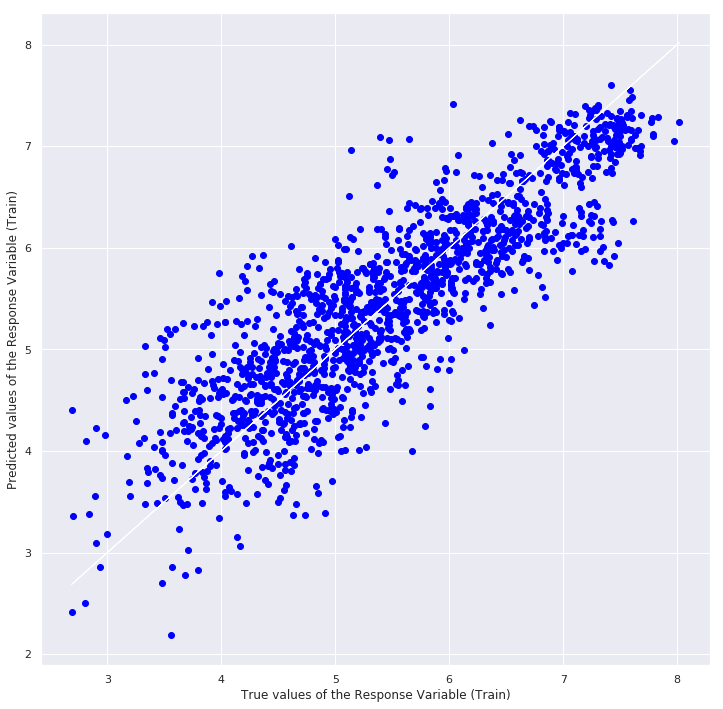

Goodness of Fit of Model 	
Score of model (R^2) 	: [0.78334848 0.73982545 0.70136535 0.68266193 0.78188056]
Error of prediction (MSE) 	: 0.3160911469384231
Accuracy of prediction 	: 0.7465863137699915



In [39]:
y_val_pred_L = cross_val_predict(linreg, X, y, cv=5)    # estimate how well this model will do for predictions

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y, y_val_pred_L, color = "blue")
plt.plot(y, y, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \t")
print("Score of model (R^2) \t:", cross_val_score(linreg, X, y, cv=5))    # R^2 values for each training and validation iteration
print("Error of prediction (MSE) \t:", mean_squared_error(y, y_val_pred_L))
print("Accuracy of prediction \t:", metrics.r2_score(y, y_val_pred_L))    # how well this model should do for predictions
print()

### <font color='grey'> Actual performance of the model</font>

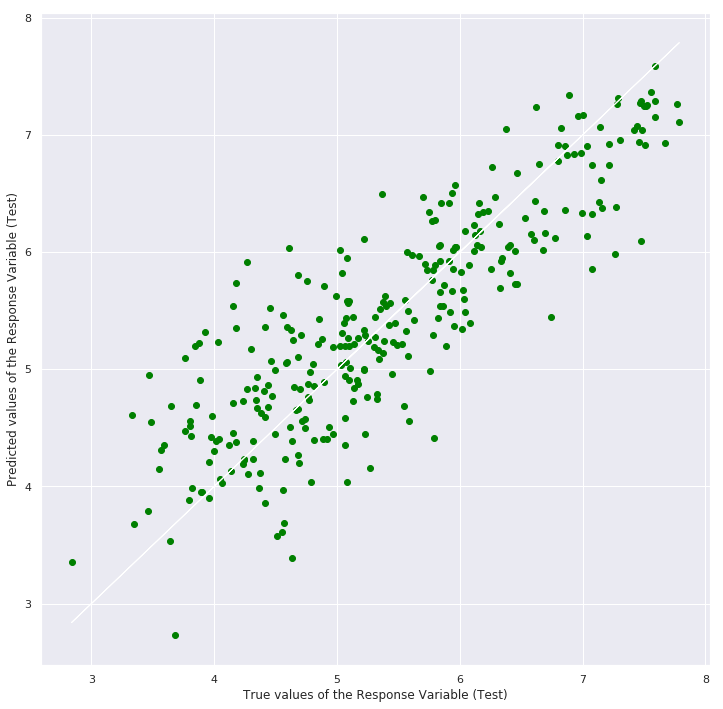

Goodness of Fit of Model 	Test Dataset
Score of model (R^2) 	: 0.7405087090158712
Erroe of prediction (MSE) 	: 0.31393589711789643
Accuracy of prediction 	: 0.7405087090158713



In [40]:
y_test_pred_L = linreg.predict(X_test)

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_test, y_test_pred_L, color = "green")
plt.plot(y_test, y_test, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Test)")
plt.ylabel("Predicted values of the Response Variable (Test)")
plt.show()

print("Goodness of Fit of Model \tTest Dataset")
print("Score of model (R^2) \t:", linreg.score(X_test, y_test))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_test, y_test_pred_L))
print("Accuracy of prediction \t:", metrics.r2_score(y_test, y_test_pred_L))    # how well the model actually did on the test set
print()

## <font color='purple'>Random forest regressor model</font>

In [41]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()

In [42]:
rfr.fit(X_train,y_train.values.ravel())

/home/cuong/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

### <font color='grey'> Using cross validation to get an estimate of how well the model will do</font>

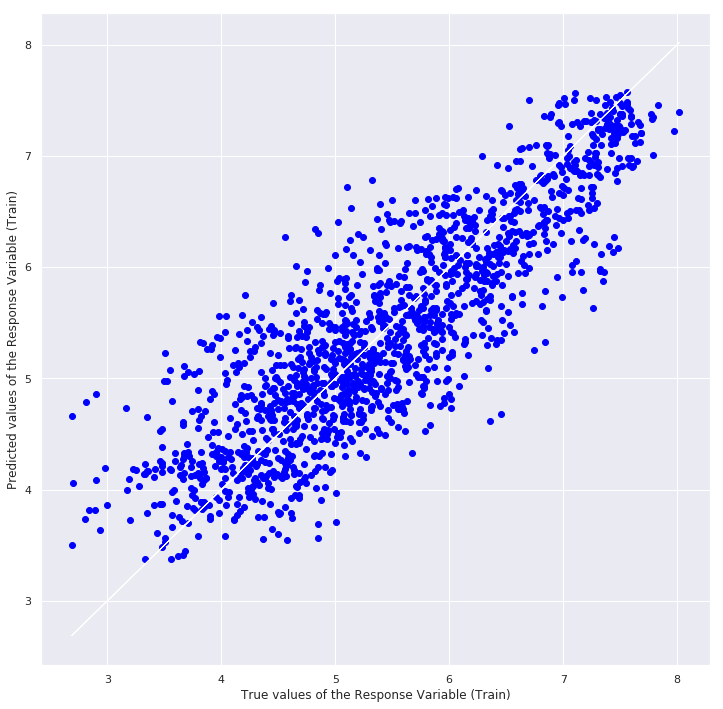

Goodness of Fit of Model 	
Score of model (R^2) 	: [0.76771457 0.71060757 0.6745848  0.76390622 0.7977516 ]
Error of prediction (MSE) 	: 0.31391456303503273
Accuracy of prediction 	: 0.7483313045920676



In [43]:
y_val_pred_R = cross_val_predict(rfr, X, y.values.ravel(), cv=5)    # estimate how well this model will do for predictions

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y, y_val_pred_R, color = "blue")
plt.plot(y, y, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \t")
print("Score of model (R^2) \t:", cross_val_score(rfr, X, y.values.ravel(), cv=5))    # R^2 values for each training and validation iteration
print("Error of prediction (MSE) \t:", mean_squared_error(y, y_val_pred_R))
print("Accuracy of prediction \t:", metrics.r2_score(y, y_val_pred_R))    # how well this model should do for predictions
print()

### <font color='grey'> Actual performance of the model</font>

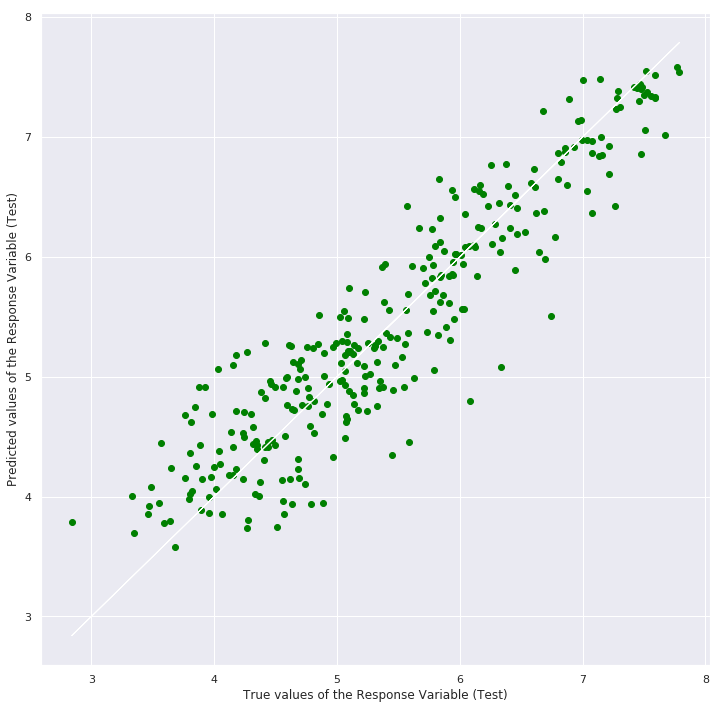

Goodness of Fit of Model 	Test Dataset
Score of model (R^2) 	: 0.8553657278312384
Erroe of prediction (MSE) 	: 0.17498040036369195
Accuracy of prediction 	: 0.8553657278312385



In [44]:
y_test_pred_R = rfr.predict(X_test)

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_test, y_test_pred_R, color = "green")
plt.plot(y_test, y_test, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Test)")
plt.ylabel("Predicted values of the Response Variable (Test)")
plt.show()

print("Goodness of Fit of Model \tTest Dataset")
print("Score of model (R^2) \t:", rfr.score(X_test, y_test))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_test, y_test_pred_R))
print("Accuracy of prediction \t:", metrics.r2_score(y_test, y_test_pred_R))    # how well the model actually did on the test set
print()

## <font color='purple'>Multi-layer perceptron regressior model</font>

### <font color='grey'> Data scaling</font>

In [45]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [46]:
X_tr = pd.DataFrame(scaler.transform(X_train))
X_te = pd.DataFrame(scaler.transform(X_test))

In [47]:
scaler.fit(y_train)
y_tr = pd.DataFrame(scaler.transform(y_train))
y_te = pd.DataFrame(scaler.transform(y_test))

<font color='red'>**_Data scaling is important here to avoid exploding of gradient_**</font>

In [48]:
from sklearn.neural_network import MLPRegressor
mlpr = MLPRegressor(hidden_layer_sizes=(10), activation='tanh', solver='sgd',alpha=0.001,batch_size='auto',
               learning_rate='constant', learning_rate_init=0.01, power_t=0.5, max_iter=1000, shuffle=True,
               random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9,
               nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999,
               epsilon=1e-08)

In [49]:
reg = mlpr.fit(X_tr,y_tr.values.ravel())

### <font color='grey'> Using cross validation to get an estimate of how well the model will do</font>

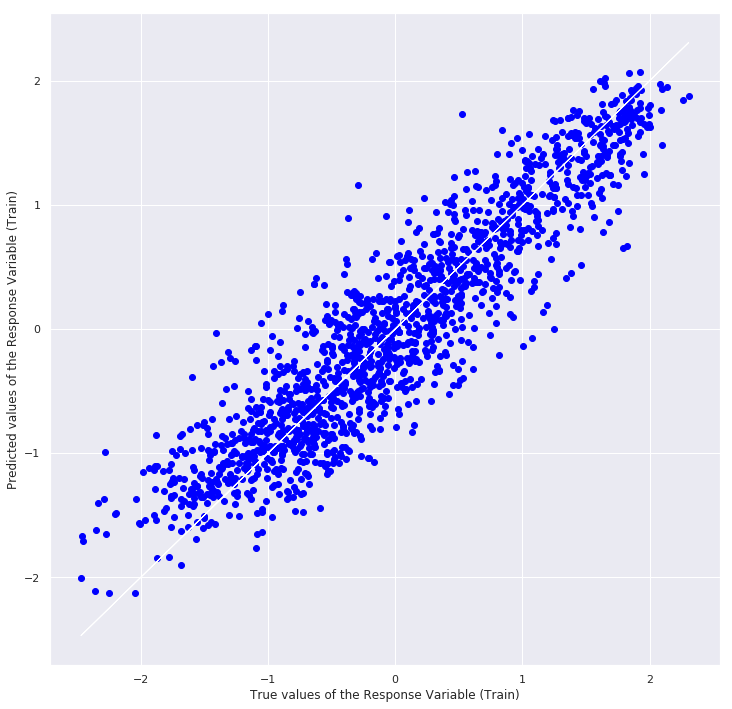

Goodness of Fit of Model 	
Score of model (R^2) 	: [0.78129964 0.68484675 0.672115   0.65897622 0.777589  ]
Error of prediction (MSE) 	: 0.14997519457654698
Accuracy of prediction 	: 0.8500248054234529



In [50]:
scaler.fit(X)
X_sc = pd.DataFrame(scaler.transform(X))
scaler.fit(y)
y_sc = pd.DataFrame(scaler.transform(y))

y_val_pred_M = reg.predict(X_sc)

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_sc, y_val_pred_M, color = "blue")
plt.plot(y_sc, y_sc, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \t")
print("Score of model (R^2) \t:", cross_val_score(reg, X_sc, y_sc.values.ravel(), cv=5))    # R^2 values for each training and validation iteration
print("Error of prediction (MSE) \t:", mean_squared_error(y_sc, y_val_pred_M))
print("Accuracy of prediction \t:", metrics.r2_score(y_sc, y_val_pred_M))    # how well this model should do for predictions
print()

### <font color='grey'> Actual performance of the model</font>

In [51]:
y_test_pred_M = reg.predict(X_te)

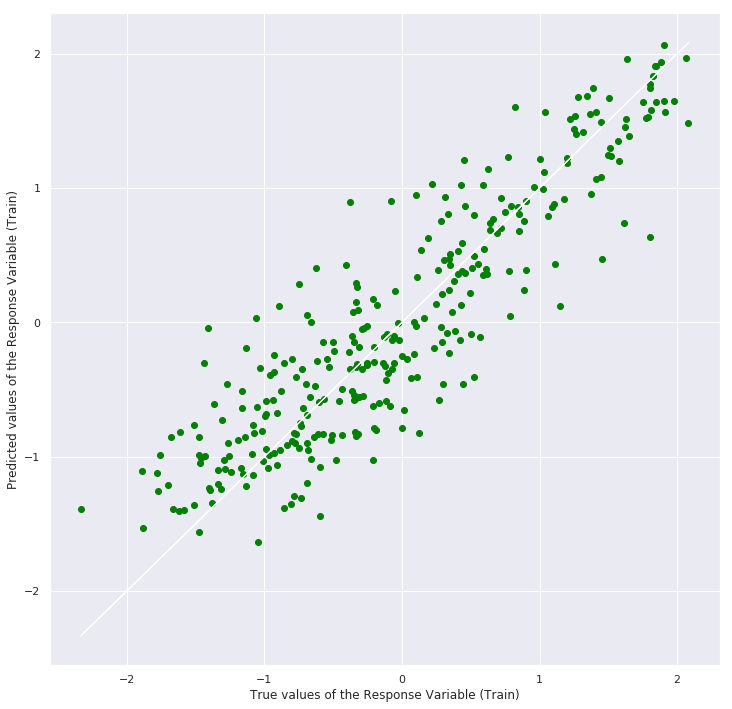

Goodness of Fit of Model 	Test Dataset
Score of model (R^2) 	: 0.8028038404178273
Erroe of prediction (MSE) 	: 0.1898963019072711
Accuracy of prediction 	: 0.8028038404178273



In [52]:
f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_te, y_test_pred_M, color = "green")
plt.plot(y_te, y_te, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \tTest Dataset")
print("Score of model (R^2) \t:", reg.score(X_te, y_te))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_te, y_test_pred_M))
print("Accuracy of prediction \t:", metrics.r2_score(y_te, y_test_pred_M))    # how well the model actually did on the test set
print()

# Prediction of 2018 Life Ladder

In [53]:
data_2018 = pd.read_excel('WHR2019Chapter2OnlineData.xls',sheet_name = 'Table2.1')

In [54]:
data_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1704 entries, 0 to 1703
Data columns (total 26 columns):
Country name                                                1704 non-null object
Year                                                        1704 non-null int64
Life Ladder                                                 1704 non-null float64
Log GDP per capita                                          1676 non-null float64
Social support                                              1691 non-null float64
Healthy life expectancy at birth                            1676 non-null float64
Freedom to make life choices                                1675 non-null float64
Generosity                                                  1622 non-null float64
Perceptions of corruption                                   1608 non-null float64
Positive affect                                             1685 non-null float64
Negative affect                                             1691 non-null fl

In [55]:
overall = pd.DataFrame(data_2018[['Year','Country name','Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Generosity','Perceptions of corruption','Positive affect','Negative affect','Confidence in national government','Democratic Quality','Delivery Quality','Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year','GINI index (World Bank estimate)','GINI index (World Bank estimate), average 2000-16','gini of household income reported in Gallup, by wp5-year']])

In [56]:
overall.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1704 entries, 0 to 1703
Data columns (total 19 columns):
Year                                                        1704 non-null int64
Country name                                                1704 non-null object
Life Ladder                                                 1704 non-null float64
Log GDP per capita                                          1676 non-null float64
Social support                                              1691 non-null float64
Healthy life expectancy at birth                            1676 non-null float64
Freedom to make life choices                                1675 non-null float64
Generosity                                                  1622 non-null float64
Perceptions of corruption                                   1608 non-null float64
Positive affect                                             1685 non-null float64
Negative affect                                             1691 non-null fl

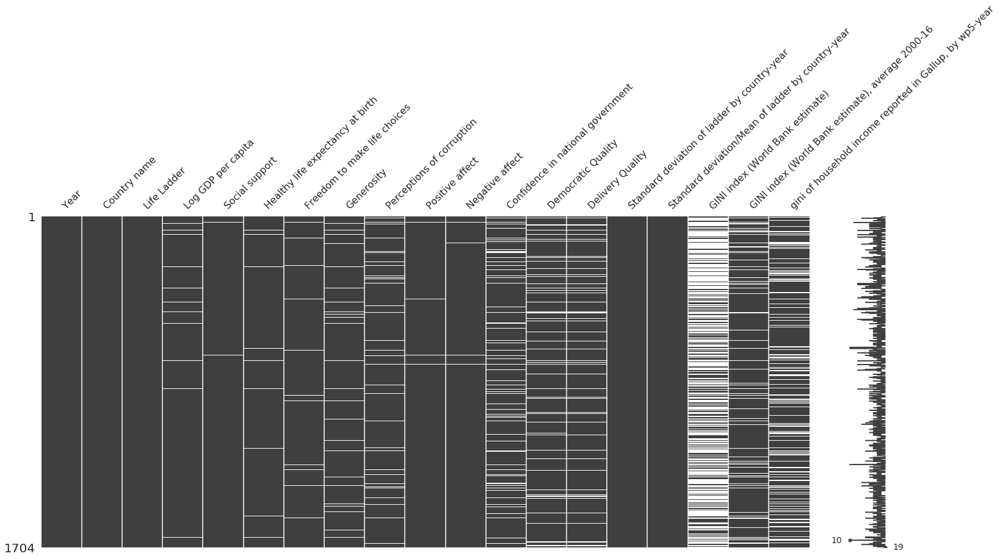

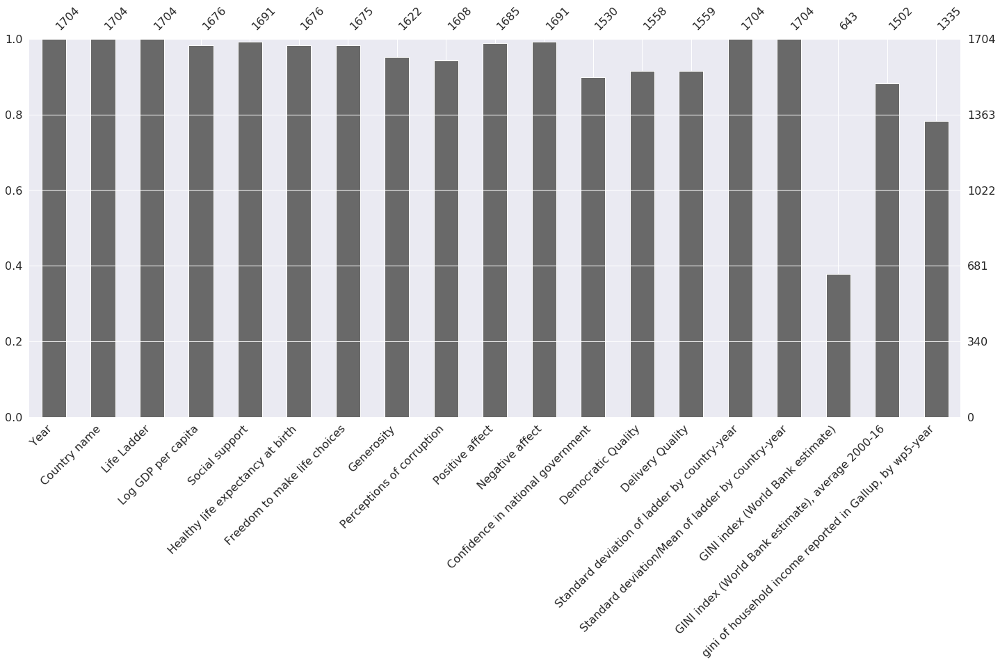

In [57]:
msn.matrix(overall.sample(1704))
msn.bar(overall.sample(1704))

In [58]:
pred_2018 = overall.interpolate(method = 'linear')

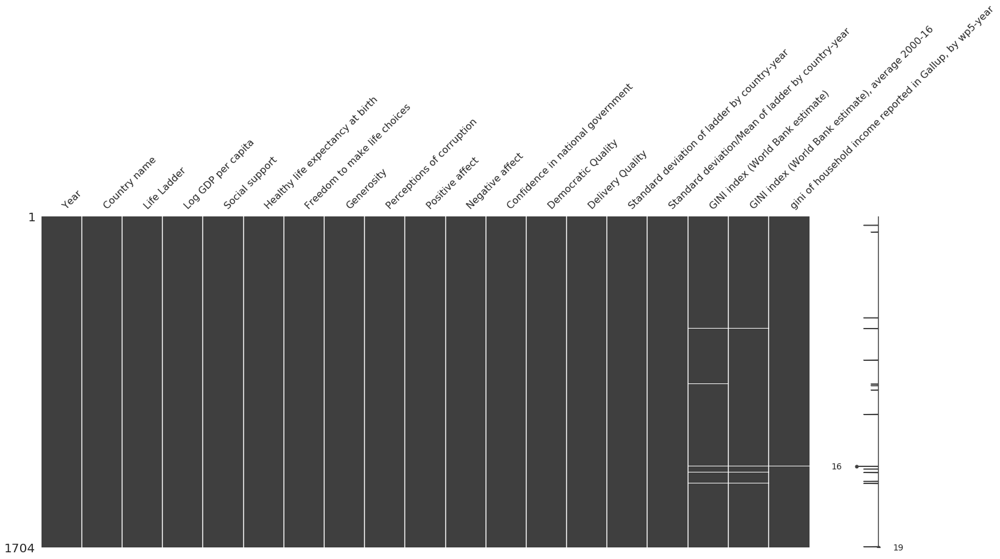

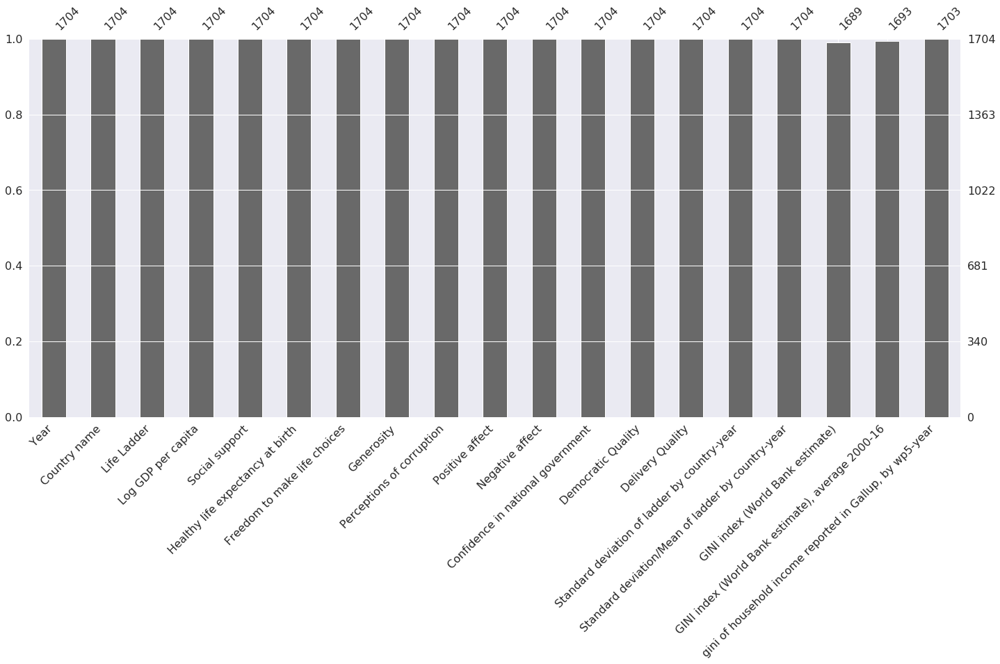

In [59]:
msn.matrix(pred_2018.sample(1704))
msn.bar(pred_2018.sample(1704))

In [60]:
pred_2018 = pred_2018.dropna()
pred_2018 = pred_2018.drop(['GINI index (World Bank estimate)'],axis = 1)
pred_2018 = pred_2018.drop(['Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year'],axis = 1)
pred_2018 = pred_2018.drop(['Country name'],axis = 1)

pred_2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1689 entries, 15 to 1703
Data columns (total 15 columns):
Year                                                        1689 non-null int64
Life Ladder                                                 1689 non-null float64
Log GDP per capita                                          1689 non-null float64
Social support                                              1689 non-null float64
Healthy life expectancy at birth                            1689 non-null float64
Freedom to make life choices                                1689 non-null float64
Generosity                                                  1689 non-null float64
Perceptions of corruption                                   1689 non-null float64
Positive affect                                             1689 non-null float64
Negative affect                                             1689 non-null float64
Confidence in national government                           1689 non-null 

In [61]:
year_2018 = pred_2018[pred_2018["Year"] == 2018]
year_2018 = year_2018.drop(['Year'],axis = 1).reset_index()
year_2018 = year_2018.drop(['index'],axis = 1)
year_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135 entries, 0 to 134
Data columns (total 14 columns):
Life Ladder                                                 135 non-null float64
Log GDP per capita                                          135 non-null float64
Social support                                              135 non-null float64
Healthy life expectancy at birth                            135 non-null float64
Freedom to make life choices                                135 non-null float64
Generosity                                                  135 non-null float64
Perceptions of corruption                                   135 non-null float64
Positive affect                                             135 non-null float64
Negative affect                                             135 non-null float64
Confidence in national government                           135 non-null float64
Democratic Quality                                          135 non-null float64
Deli

In [62]:
year_2018.head(135)

,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,"GINI index (World Bank estimate), average 2000-16","gini of household income reported in Gallup, by wp5-year"
0,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129,0.713300,0.318997,0.435338,-0.420454,-0.435204,0.303250,0.456174
1,5.043086,9.557952,0.798651,65.900002,0.583381,-0.172413,0.758704,0.591043,0.292946,0.257756,-0.837525,-1.016044,0.276000,0.667872
2,5.792797,9.809972,0.899912,68.800003,0.845895,-0.206937,0.855255,0.820310,0.320502,0.261352,-0.075589,-0.227432,0.460938,0.405356
3,5.062449,9.119424,0.814449,66.900002,0.807644,-0.149109,0.676826,0.581488,0.454840,0.670828,0.283572,0.812114,0.319250,0.406403
4,7.176993,10.721021,0.940137,73.599998,0.916028,0.137795,0.404647,0.759019,0.187456,0.468837,1.182196,1.780793,0.342750,0.429814
5,7.396002,10.741893,0.911668,73.000000,0.904112,0.051552,0.523061,0.752350,0.226059,0.488679,0.001410,0.385710,0.302692,0.299504
6,5.167995,9.678014,0.781230,65.500000,0.772449,-0.251795,0.561206,0.592575,0.191392,0.834372,-0.813179,0.003701,0.211000,0.260410
7,4.499217,8.220746,0.705556,64.300003,0.901471,-0.038008,0.701421,0.541345,0.361238,0.831693,-0.868172,-0.967748,0.327750,0.367609
8,5.233770,9.778739,0.904569,66.099998,0.643602,-0.181865,0.718455,0.450333,0.235729,0.421279,0.221913,0.435039,0.281294,0.293444
9,6.892172,10.672445,0.929816,72.000000,0.808387,-0.127278,0.630412,0.749563,0.250297,0.441945,0.632354,0.490869,0.284308,0.299525


In [63]:
y_2018 = pd.DataFrame(year_2018['Life Ladder'])
X_2018 = year_2018.drop(['Life Ladder'],axis = 1)

In [64]:
y_2018_pred_L = linreg.predict(X_2018)
y_2018_pred_R = rfr.predict(X_2018)

In [65]:
scaler.fit(X_2018)    # Data scaling for MLPRegressor
X_M_2018 = pd.DataFrame(scaler.transform(X_2018))

In [66]:
scaler.fit(y_2018)    # Data scaling for MLPRegressor
y_M_2018 = pd.DataFrame(scaler.transform(y_2018))

In [67]:
y_2018_pred_M = reg.predict(X_M_2018)

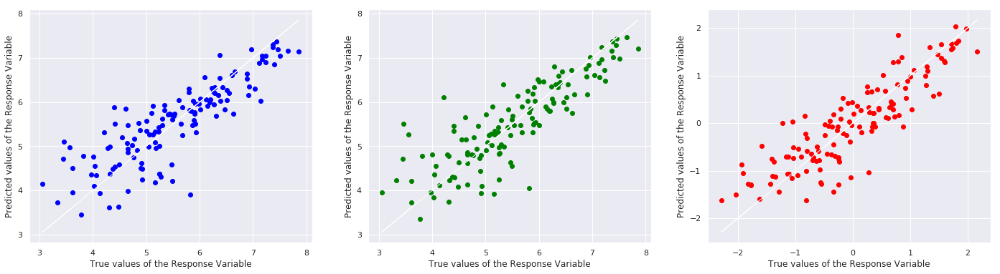

In [68]:
f, axes = plt.subplots(1, 3, figsize=(24, 6))
axes[0].scatter(y_2018, y_2018_pred_L, color = "blue")
axes[0].plot(y_2018, y_2018, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable")
axes[0].set_ylabel("Predicted values of the Response Variable")

axes[1].scatter(y_2018, y_2018_pred_R, color = "green")
axes[1].plot(y_2018, y_2018, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable")
axes[1].set_ylabel("Predicted values of the Response Variable")

axes[2].scatter(y_M_2018, y_2018_pred_M, color = "red")
axes[2].plot(y_M_2018, y_M_2018, 'w-', linewidth = 1)
axes[2].set_xlabel("True values of the Response Variable")
axes[2].set_ylabel("Predicted values of the Response Variable")
plt.show()

In [69]:
print("Goodness of Fit of Linear Regression Model \t")
print("Score of the model (R^2) \t:", linreg.score(X_2018, y_2018))
print("Error of prediction (MSE) \t:", mean_squared_error(y_2018, y_2018_pred_L))
print("Accuracy of prediction:", metrics.r2_score(y_2018, y_2018_pred_L))
print()

print("Goodness of Fit of Random Forest Regressor Model \t")
print("Score of model (R^2) \t:", rfr.score(X_2018, y_2018))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_2018, y_2018_pred_R))
print("Accuracy of prediction \t:", metrics.r2_score(y_2018, y_2018_pred_R))
print()

print("Goodness of Fit of Linear Regression Model \t")
print("Score of the model (R^2) \t:", reg.score(X_M_2018, y_M_2018))
print("Error of prediction (MSE) \t:", mean_squared_error(y_M_2018, y_2018_pred_M))
print("Accuracy of prediction:", metrics.r2_score(y_M_2018, y_2018_pred_M))
print()

Goodness of Fit of Linear Regression Model 	
Score of the model (R^2) 	: 0.71680668763076
Error of prediction (MSE) 	: 0.3281629252544789
Accuracy of prediction: 0.71680668763076

Goodness of Fit of Random Forest Regressor Model 	
Score of model (R^2) 	: 0.722511592014633
Erroe of prediction (MSE) 	: 0.3215521119720385
Accuracy of prediction 	: 0.722511592014633

Goodness of Fit of Linear Regression Model 	
Score of the model (R^2) 	: 0.7657126202749334
Error of prediction (MSE) 	: 0.23428737972506664
Accuracy of prediction: 0.7657126202749334



# Conclusion for regression

Based on the scores obtained from cross validation and those from the prediction for the test datasets, MLPRegressor and random forest regressor have higher scores and accuracies than the linear regression model, and hence would be the better models for Life Ladder predictions in the future.

# K-Means Clustering

In [70]:
# Extract the data with the most important features to cluster 
cluster_data = pd.DataFrame(data_complete[['country','Region indicator','Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Democratic Quality','Delivery Quality','Positive affect','Generosity']])

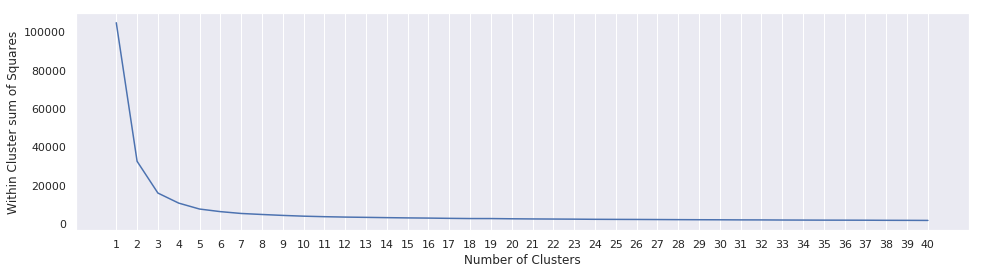

In [71]:
min_clust = 1
max_clust = 40
init_algo = 'k-means++'

from sklearn.cluster import KMeans
# Computer Within Cluster Sum of Squares
within_ss=[]
for num_clust in range(min_clust,max_clust+1):
    kmeans = KMeans(n_clusters = num_clust, init = init_algo,n_init=5)
    kmeans.fit(cluster_data.drop(columns=['country','Region indicator'])) 
    within_ss.append(kmeans.inertia_)

# Angle Plot: Within SS vs Number of Clusters
f, axes = plt.subplots(1,1,figsize=(16,4))
plt.plot(range(min_clust,max_clust+1),within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1,1.0))
plt.grid(which='major', axis='y')
plt.show()
# From the plot, we choose 4 as the number of the clusters

In [72]:
from sklearn.cluster import KMeans
# Set Clustering parameters
num_clust = 4
init_algo = "k-means++"

# Create Clustering Models using K-Means
kmeans = KMeans(n_clusters=num_clust, init = init_algo, n_init=20)

# Fit the Clustering Model on the data 
kmeans.fit(cluster_data.drop(columns = ['country','Region indicator']))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=20, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

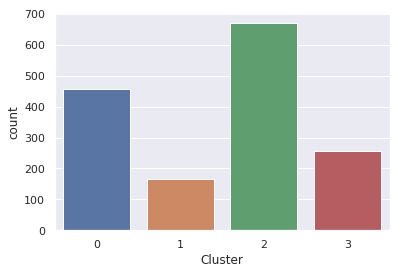

In [73]:
# Predict the cluster labels
labels1 = kmeans.predict(cluster_data.drop(columns = ['country','Region indicator']))

# Appends labels to the data
data_labeled1 = cluster_data.copy()
data_labeled1["Cluster"] = pd.Categorical(labels1)

# summary of cluster labels
sb.countplot(data_labeled1["Cluster"])

In [74]:
# Print out the regions in each cluster 
for i in range(4):
    print("Cluster :",i)
    print(data_labeled1[data_labeled1["Cluster"]==i]['Region indicator'].value_counts())
    # value_counts to count the number of countries in each region in the cluster

Cluster : 0
Western Europe                  206
Central and Eastern Europe       54
East Asia                        53
Latin America and Caribbean      52
North America and ANZ            45
Middle East and North Africa     35
Southeast Asia                   11
Name: Region indicator, dtype: int64
Cluster : 1
Sub-Saharan Africa             160
None                             5
Latin America and Caribbean      1
Western Europe                   1
Name: Region indicator, dtype: int64
Cluster : 2
Latin America and Caribbean           166
Commonwealth of Independent States    138
Middle East and North Africa          136
Central and Eastern Europe            118
Southeast Asia                         57
South Asia                             34
East Asia                              12
Sub-Saharan Africa                      4
None                                    3
Western Europe                          2
Name: Region indicator, dtype: int64
Cluster : 3
Sub-Saharan Africa           

/home/cuong/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


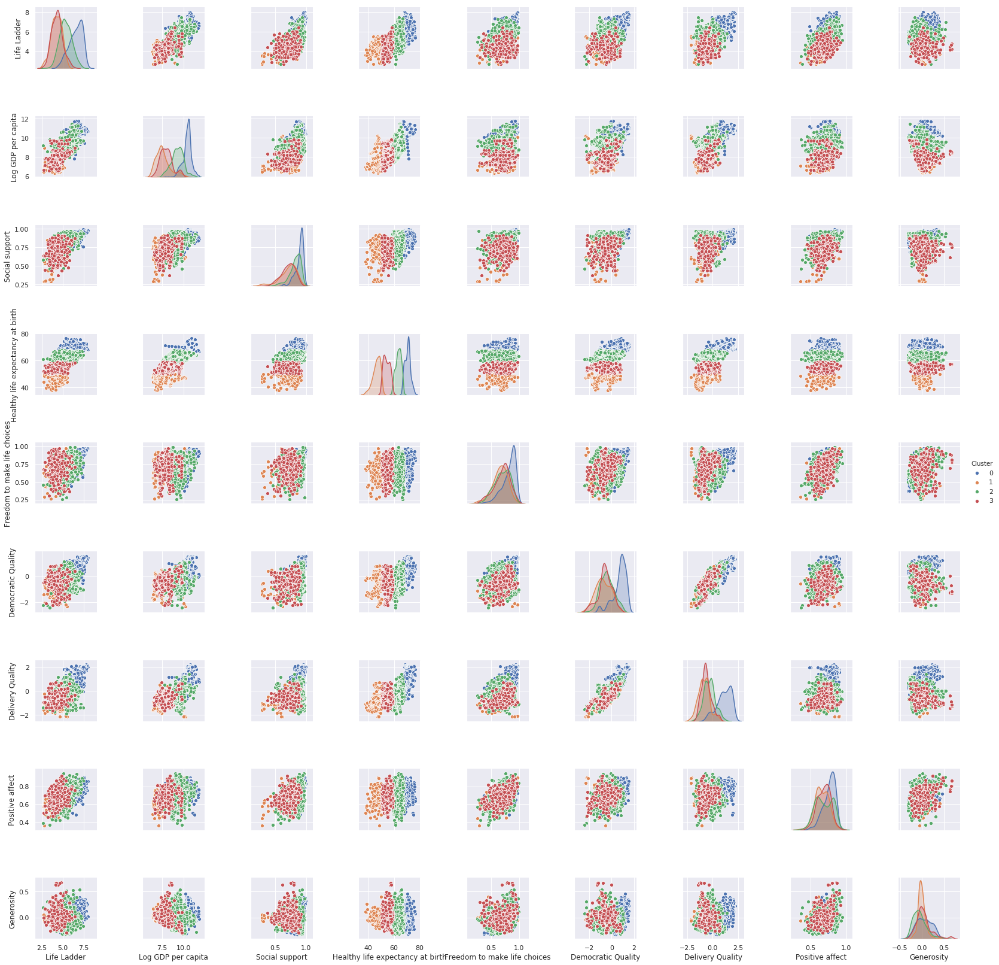

In [75]:
# Plot the clusters on 2D grid
sb.pairplot(data_labeled1, vars = cluster_data.drop(columns=['country','Region indicator']).columns.values, hue = "Cluster")

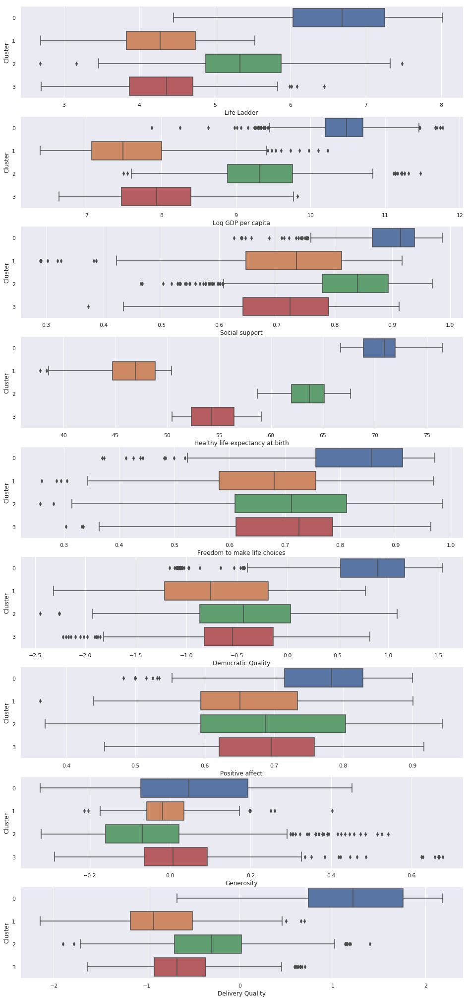

In [76]:
# Boxplots of all the features against the clusters
features = ['Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Democratic Quality','Positive affect','Generosity','Delivery Quality']
count = 0
f, axes = plt.subplots(9
                       ,1, figsize=(16,36))
for i in features:
    sb.boxplot(x = i,y='Cluster',data=data_labeled1,ax =axes[count])
    count+=1

<font color='blue'>
After the observations of regions in clusters and the boxplots of all the features against the clusters, we conclude:
<br>1/ Two clusters are mostly Sub-Saharan Africa, worst performers in most of the aspects (except Generosity).
<br>2/ One cluster comprises of mainly Europe countries (mostly Western Europe), they perform best in all aspects (except Generosity.
<br>3/ The remaining cluster is an intermediate performer.
<br>4/ The healthy life expectancy at birth are separated clearly between among clusters
</font>

# BIRCH Clustering

In [77]:
# Extract the data with the most important features to cluster
cluster_data = pd.DataFrame(data_complete[['country','Region indicator','Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Democratic Quality','Delivery Quality','Positive affect','Generosity']])

In [78]:
from sklearn.cluster import Birch
# Here we choose the number of cluster to be 4 for comparison with K-Means Clustering
birch = Birch(n_clusters=4)
birch.fit(cluster_data.drop(columns=['country','Region indicator']))


Birch(branching_factor=50, compute_labels=True, copy=True, n_clusters=4,
   threshold=0.5)

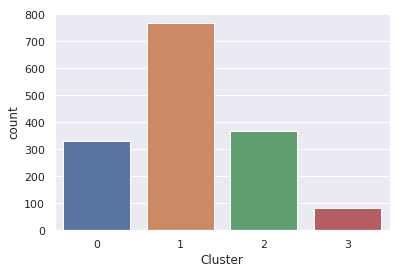

In [79]:
# Predict the cluster labels
labels2 = birch.predict(cluster_data.drop(columns=['country','Region indicator']))

# Append labels to the data
data_labeled2 = cluster_data.copy()
data_labeled2['Cluster'] = pd.Categorical(labels2)

# summary of cluster labels
sb.countplot(data_labeled2["Cluster"])

In [80]:
# Print out the regions in each cluster
for i in range(4):
    print("Cluster: ", i)
    print(data_labeled2[data_labeled2["Cluster"]==i]['Region indicator'].value_counts())
    # value_counts to count the number of countries in each region in the cluster

Cluster:  0
Sub-Saharan Africa              244
South Asia                       24
Southeast Asia                   24
Latin America and Caribbean      16
Middle East and North Africa     10
None                              9
Western Europe                    3
Name: Region indicator, dtype: int64
Cluster:  1
Latin America and Caribbean           195
Middle East and North Africa          158
Central and Eastern Europe            148
Commonwealth of Independent States    139
Southeast Asia                         58
South Asia                             38
East Asia                              22
Sub-Saharan Africa                      4
None                                    3
Western Europe                          2
Name: Region indicator, dtype: int64
Cluster:  2
Western Europe                  206
North America and ANZ            45
East Asia                        43
Latin America and Caribbean      25
Central and Eastern Europe       24
Middle East and North Africa     13
So

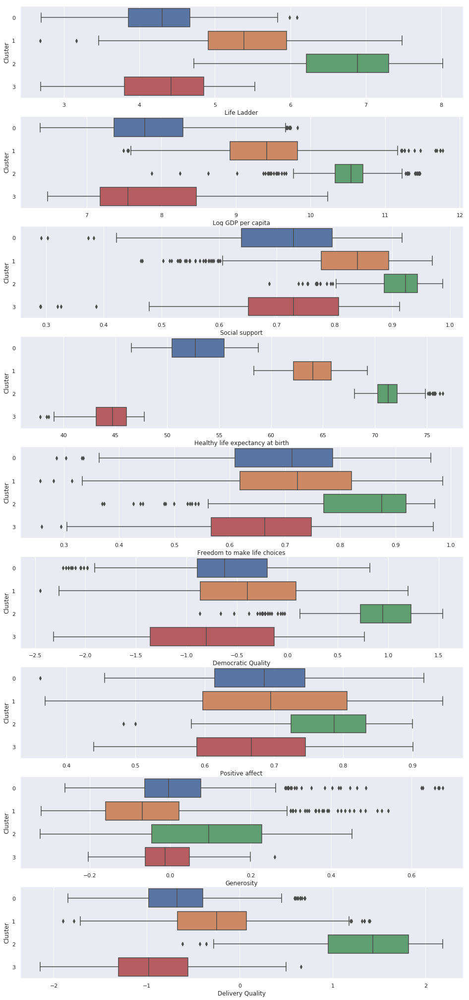

In [81]:
# Boxplots of all the features against the clusters
features = ['Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Democratic Quality','Positive affect','Generosity','Delivery Quality']
count = 0
f, axes = plt.subplots(9
                       ,1, figsize=(16,36))
for i in features:
    sb.boxplot(x = i,y='Cluster',data=data_labeled2,ax =axes[count])
    count+=1

<font color='blue'>
We reach the same conclusion as K-Means:
<br>1/ Two clusters are mostly Sub-Saharan Africa, worst performers in most of the aspects (except Generosity).
<br>2/ One cluster comprises of mainly Europe countries (mostly Western Europe), they perform best most aspects (except Generosity.)
<br>3/ The remaining cluster is an intermediate performer.
<br>4/ The healthy life expectancy at birth are separated clearly between among clusters
</font>

# Conclusion for clustering

Two methods yield similar results. While Sub-Saharan Africa countries perform almost worst in many factors, Western Europe countries perform best.